## Question 3.1 Part A

In [1]:
%matplotlib inline
from datetime import date
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from mpl_toolkits.basemap import Basemap
import numpy as np

In [2]:
# import the data as a dataframe and set display options.
covid_df = pd.read_csv (r'C:\Users\kiera\OneDrive\Desktop\BSC Computer Science\Data Science for Economics\CA2\Q3 Data\owid-covid-data.csv')
covid_df = covid_df[~ covid_df.duplicated()] 
pd.set_option("display.max_rows", None, "display.max_columns", None)

# convert the date column to datetime objects and create a column for days since 01/01/2020.
covid_df['date_object'] = pd.to_datetime(covid_df['date'], dayfirst=True)
covid_df['days_since'] = (covid_df['date_object']) - pd.to_datetime('01/01/2020', dayfirst=True)
covid_df["days_since"] = covid_df["days_since"].dt.days

In [3]:
# set the characteristics of each sub-plot.
def style_ax(ax):
    ax.legend(loc='lower right')
    ax.set_yscale('log')
    ax.set_xlim([60, 440])
    axs[0].set_ylabel('New Cases per Million')
    axs[0].set_ylim([0.0005, 1000])
    axs[1].set_ylabel('Total Cases per Million')
    axs[1].set_xlabel('Days since 2020-01-01')

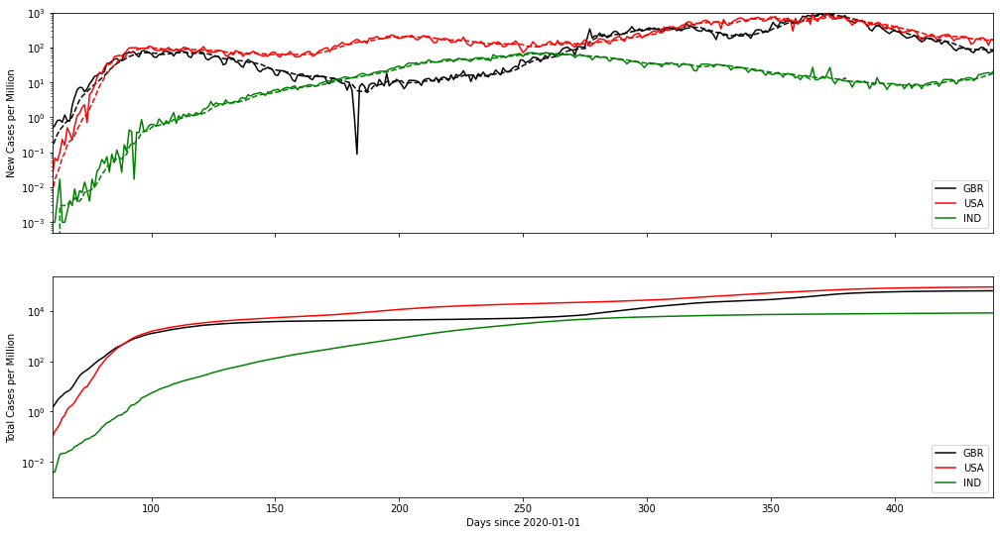

In [41]:
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(17, 9))

# remove any missing cases data rows.
covid_df = covid_df[covid_df.new_cases_per_million != 0]

# create dataframes containing data from specific locations.
dataset_gbr = covid_df[(covid_df['iso_code'] == "GBR")]
dataset_gbr.name = 'GBR'
dataset_usa = covid_df[(covid_df['iso_code'] == "USA")]
dataset_usa.name = 'USA'
dataset_ind = covid_df[(covid_df['iso_code'] == "IND")]
dataset_ind.name = 'IND'

# create sub-plots ax[0] and ax[1] where ax[0] is the above plot(new cases per million) and ax[1] is the below plot(total cases per million.
for frame in [dataset_gbr, dataset_usa, dataset_ind]:
    # plot lines for GBR.
    if frame.name == 'GBR':
        axs[1].plot(frame['days_since'], frame['total_cases_per_million'], label = 'GBR', color = 'black')
        axs[0].plot(frame['days_since'], frame['new_cases_per_million'], label = 'GBR', color = 'black')
        axs[0].plot(frame['days_since'], frame['new_cases_smoothed_per_million'], '--', color = 'black')
        
    # plot lines for USA.
    if frame.name == 'USA':
        axs[1].plot(frame['days_since'], frame['total_cases_per_million'], label = 'USA', color = 'red')
        axs[0].plot(frame['days_since'], frame['new_cases_per_million'], label = 'USA', color = 'red')
        axs[0].plot(frame['days_since'], frame['new_cases_smoothed_per_million'], '--', color = 'red')
        
    # plot lines for IND.
    if frame.name == 'IND':
        axs[1].plot(frame['days_since'], frame['total_cases_per_million'], label = 'IND', color = 'green')
        axs[0].plot(frame['days_since'], frame['new_cases_per_million'], label = 'IND', color = 'green')
        axs[0].plot(frame['days_since'], frame['new_cases_smoothed_per_million'], '--', color = 'green')

# style all sub-plots.
for ax in axs:
    style_ax(ax)

plt.show()



## Question 3.1  Part B

Text(0, 0.5, 'Total Cases per Million at 01/01/2021')

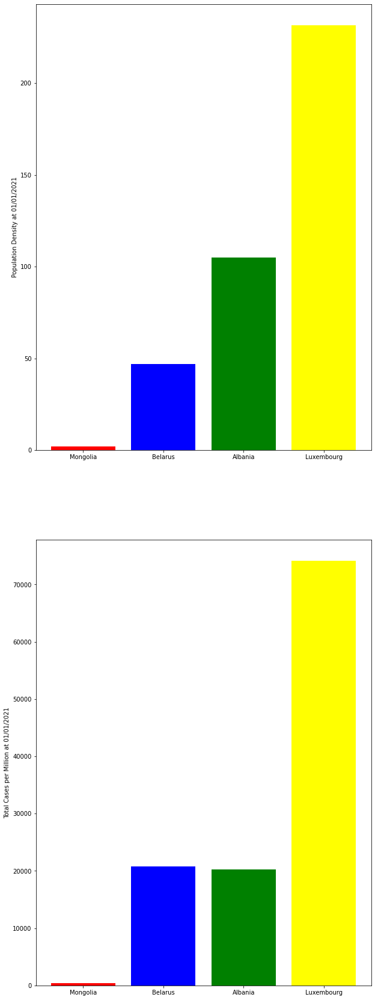

In [5]:
fig, axs = plt.subplots(2, 1, sharex=False, figsize=(10, 30))

# create dataframes containing data from specific locations.
dataset_mng = covid_df[(covid_df['iso_code'] == "MNG") & (covid_df['date'] == "01/01/2021")]
dataset_mng.name = 'MNG'
dataset_blr = covid_df[(covid_df['iso_code'] == "BLR") & (covid_df['date'] == "01/01/2021")]
dataset_blr.name = 'BLR'
dataset_alb = covid_df[(covid_df['iso_code'] == "ALB") & (covid_df['date'] == "01/01/2021")]
dataset_alb.name = 'ALB'
dataset_lux = covid_df[(covid_df['iso_code'] == "LUX") & (covid_df['date'] == "01/01/2021")]
dataset_lux.name = 'LUX'

# create sub-plots ax[0] and ax[1] where ax[0] is the above plot(new cases per million) and ax[1] is the below plot(total cases per million.
for frame in [dataset_mng, dataset_blr, dataset_alb, dataset_lux]:
    # plot lines for MNG.
    if frame.name == 'MNG':
        axs[0].bar('Mongolia', frame['population_density'], color = 'red')
        axs[1].bar('Mongolia', frame['total_cases_per_million'], color = 'red')

    # plot lines for BLR.
    if frame.name == 'BLR':
        axs[0].bar('Belarus', frame['population_density'], color = 'blue')
        axs[1].bar('Belarus', frame['total_cases_per_million'], color = 'blue')
        
    # plot lines for ALB.
    if frame.name == 'ALB':
        axs[0].bar('Albania', frame['population_density'], color = 'green')
        axs[1].bar('Albania', frame['total_cases_per_million'], color = 'green')
        
    # plot lines for LUX.
    if frame.name == 'LUX':
        axs[0].bar('Luxembourg', frame['population_density'], color = 'yellow')
        axs[1].bar('Luxembourg', frame['total_cases_per_million'], color = 'yellow')

axs[0].set_ylabel('Population Density at 01/01/2021')
axs[1].set_ylabel('Total Cases per Million at 01/01/2021')



The above plots show the population density and total cases per million from four countries with different population densities. The purpose of this analysis is to explore whether higher concentrations of people increase the spread of covid, as would be expected of a contagion. As can be seen from the plots there is a cause and effect relationship between the population density and total cases except for the case of Albania implying underlying factors causing Albania to have lower total cases. All data used for these plots was gathered on 01/01/2021.

## Question 3.2 Part A

In [6]:
# load in the GoT data and remove any duplicates.
got_df = pd.read_csv(r'C:\Users\kiera\OneDrive\Desktop\BSC Computer Science\Data Science for Economics\CA2\Q3 Data\GoT_character.csv')
got_df = got_df[~ got_df.duplicated()] 

In [7]:
# create a column for character IDs.
got_df.insert(loc=0, column='ID', value=['C'+str(i).zfill(4) for i in range(len(got_df.index))])
got_df

,ID,S.No,plod,name,title,male,culture,dateOfBirth,DateoFdeath,mother,father,heir,house,spouse,book1,book2,book3,book4,book5,isAliveMother,isAliveFather,isAliveHeir,isAliveSpouse,isMarried,isNoble,age,numDeadRelations,boolDeadRelations,isPopular,popularity,isAlive
0,C0000,1,0.946,Viserys II Targaryen,NaN,1,NaN,NaN,NaN,Rhaenyra Targaryen,Daemon Targaryen,Aegon IV Targaryen,NaN,NaN,0,0,0,0,0,1.0,0.0,0.0,NaN,0,0,NaN,11,1,1,0.605351,0
1,C0001,2,0.613,Walder Frey,Lord of the Crossing,1,Rivermen,208.0,NaN,NaN,NaN,NaN,House Frey,Perra Royce,1,1,1,1,1,NaN,NaN,NaN,1.0,1,1,97.0,1,1,1,0.896321,1
2,C0002,3,0.507,Addison Hill,Ser,1,NaN,NaN,NaN,NaN,NaN,NaN,House Swyft,NaN,0,0,0,1,0,NaN,NaN,NaN,NaN,0,1,NaN,0,0,0,0.267559,1
3,C0003,4,0.924,Aemma Arryn,Queen,0,NaN,82.0,105.0,NaN,NaN,NaN,House Arryn,Viserys I Targaryen,0,0,0,0,0,NaN,NaN,NaN,0.0,1,1,23.0,0,0,0,0.183946,0
4,C0004,5,0.383,Sylva Santagar,Greenstone,0,Dornish,276.0,NaN,NaN,NaN,NaN,House Santagar,Eldon Estermont,0,0,0,1,0,NaN,NaN,NaN,1.0,1,1,29.0,0,0,0,0.043478,1
5,C0005,6,0.979,Tommen Baratheon,NaN,1,NaN,NaN,NaN,Cersei Lannister,Robert Baratheon,Myrcella Baratheon,NaN,NaN,0,0,0,0,0,1.0,1.0,1.0,NaN,0,0,NaN,5,1,1,1.000000,1
6,C0006,7,0.986,Valarr Targaryen,Hand of the King,1,Valyrian,183.0,209.0,NaN,NaN,NaN,House Targaryen,Kiera of Tyrosh,0,0,0,0,0,NaN,NaN,NaN,1.0,1,1,26.0,0,0,1,0.431438,0
7,C0007,8,0.964,Viserys I Targaryen,NaN,1,NaN,NaN,NaN,Alyssa Targaryen,Baelon Targaryen,Rhaenyra Targaryen,NaN,NaN,0,0,0,0,0,1.0,1.0,1.0,NaN,0,0,NaN,5,1,1,0.678930,0
8,C0008,9,0.276,Wilbert,Ser,1,NaN,NaN,298.0,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0,NaN,NaN,NaN,NaN,0,1,NaN,0,0,0,0.006689,0
9,C0009,10,0.609,Wilbert Osgrey,Ser,1,NaN,NaN,NaN,NaN,NaN,NaN,House Osgrey,NaN,0,0,0,0,0,NaN,NaN,NaN,NaN,0,1,NaN,0,0,0,0.020067,1


In [8]:
# create a new df containg the node data and format the column names.
node_df = got_df[['ID','name','isNoble']]
node_df = node_df.rename(columns={'name':'Label'})
node_df

,ID,Label,isNoble
0,C0000,Viserys II Targaryen,0
1,C0001,Walder Frey,1
2,C0002,Addison Hill,1
3,C0003,Aemma Arryn,1
4,C0004,Sylva Santagar,1
5,C0005,Tommen Baratheon,0
6,C0006,Valarr Targaryen,1
7,C0007,Viserys I Targaryen,0
8,C0008,Wilbert,1
9,C0009,Wilbert Osgrey,1


In [9]:
# export the node file.
node_df.to_csv(r'C:\Users\kiera\OneDrive\Desktop\BSC Computer Science\Data Science for Economics\CA2\Q3 Data\nodes.csv' ,index=False)

In [10]:
# create 2 dfs showing character's mothers.
mother_df = got_df[['ID','name','mother']]
mother_df

,ID,name,mother
0,C0000,Viserys II Targaryen,Rhaenyra Targaryen
1,C0001,Walder Frey,NaN
2,C0002,Addison Hill,NaN
3,C0003,Aemma Arryn,NaN
4,C0004,Sylva Santagar,NaN
5,C0005,Tommen Baratheon,Cersei Lannister
6,C0006,Valarr Targaryen,NaN
7,C0007,Viserys I Targaryen,Alyssa Targaryen
8,C0008,Wilbert,NaN
9,C0009,Wilbert Osgrey,NaN


In [11]:
mother_df2 = mother_df[['name','mother']]
mother_df2

,name,mother
0,Viserys II Targaryen,Rhaenyra Targaryen
1,Walder Frey,NaN
2,Addison Hill,NaN
3,Aemma Arryn,NaN
4,Sylva Santagar,NaN
5,Tommen Baratheon,Cersei Lannister
6,Valarr Targaryen,NaN
7,Viserys I Targaryen,Alyssa Targaryen
8,Wilbert,NaN
9,Wilbert Osgrey,NaN


In [12]:
# merge the two dfs.
merged_df = mother_df2.merge(mother_df[['ID', 'name']], how = 'outer', on = 'name')
merged_df

,name,mother,ID
0,Viserys II Targaryen,Rhaenyra Targaryen,C0000
1,Walder Frey,NaN,C0001
2,Addison Hill,NaN,C0002
3,Aemma Arryn,NaN,C0003
4,Sylva Santagar,NaN,C0004
5,Tommen Baratheon,Cersei Lannister,C0005
6,Valarr Targaryen,NaN,C0006
7,Viserys I Targaryen,Alyssa Targaryen,C0007
8,Wilbert,NaN,C0008
9,Wilbert Osgrey,NaN,C0009


In [13]:
# merge the newly made merged df with the origial df.
merged_df2 = merged_df.merge(mother_df[['ID', 'name']], how = 'left', left_on = 'mother', right_on = 'name')
merged_df2

,name_x,mother,ID_x,ID_y,name_y
0,Viserys II Targaryen,Rhaenyra Targaryen,C0000,NaN,NaN
1,Walder Frey,NaN,C0001,NaN,NaN
2,Addison Hill,NaN,C0002,NaN,NaN
3,Aemma Arryn,NaN,C0003,NaN,NaN
4,Sylva Santagar,NaN,C0004,NaN,NaN
5,Tommen Baratheon,Cersei Lannister,C0005,C1481,Cersei Lannister
6,Valarr Targaryen,NaN,C0006,NaN,NaN
7,Viserys I Targaryen,Alyssa Targaryen,C0007,NaN,NaN
8,Wilbert,NaN,C0008,NaN,NaN
9,Wilbert Osgrey,NaN,C0009,NaN,NaN


In [14]:
# remove any characters that do not have a mother from the df and add a Label column.
mother_final = merged_df2[['ID_x', 'ID_y']]
mother_final = mother_final[mother_final['ID_y'].notna()]
mother_final['Label']='Mother'
mother_final

,ID_x,ID_y,Label
5,C0005,C1481,Mother
50,C0050,C1481,Mother
53,C0053,C1827,Mother
101,C0101,C0410,Mother
172,C0172,C1478,Mother
280,C0280,C1423,Mother
281,C0281,C0304,Mother
289,C0289,C0087,Mother
438,C0438,C0055,Mother


In [15]:
# create 2 dfs showing character's fathers.
father_df = got_df[['ID','name','father']]
father_df

,ID,name,father
0,C0000,Viserys II Targaryen,Daemon Targaryen
1,C0001,Walder Frey,NaN
2,C0002,Addison Hill,NaN
3,C0003,Aemma Arryn,NaN
4,C0004,Sylva Santagar,NaN
5,C0005,Tommen Baratheon,Robert Baratheon
6,C0006,Valarr Targaryen,NaN
7,C0007,Viserys I Targaryen,Baelon Targaryen
8,C0008,Wilbert,NaN
9,C0009,Wilbert Osgrey,NaN


In [16]:
father_df2 = father_df[['name','father']]
father_df2

,name,father
0,Viserys II Targaryen,Daemon Targaryen
1,Walder Frey,NaN
2,Addison Hill,NaN
3,Aemma Arryn,NaN
4,Sylva Santagar,NaN
5,Tommen Baratheon,Robert Baratheon
6,Valarr Targaryen,NaN
7,Viserys I Targaryen,Baelon Targaryen
8,Wilbert,NaN
9,Wilbert Osgrey,NaN


In [17]:
# merge the two dfs.
merged_df = father_df2.merge(father_df[['ID', 'name']], how = 'outer', on = 'name')
merged_df

,name,father,ID
0,Viserys II Targaryen,Daemon Targaryen,C0000
1,Walder Frey,NaN,C0001
2,Addison Hill,NaN,C0002
3,Aemma Arryn,NaN,C0003
4,Sylva Santagar,NaN,C0004
5,Tommen Baratheon,Robert Baratheon,C0005
6,Valarr Targaryen,NaN,C0006
7,Viserys I Targaryen,Baelon Targaryen,C0007
8,Wilbert,NaN,C0008
9,Wilbert Osgrey,NaN,C0009


In [18]:
# merge the newly made merged df with the origial df.
merged_df2 = merged_df.merge(father_df[['ID', 'name']], how = 'left', left_on = 'father', right_on = 'name')
merged_df2

,name_x,father,ID_x,ID_y,name_y
0,Viserys II Targaryen,Daemon Targaryen,C0000,C1676,Daemon Targaryen
1,Walder Frey,NaN,C0001,NaN,NaN
2,Addison Hill,NaN,C0002,NaN,NaN
3,Aemma Arryn,NaN,C0003,NaN,NaN
4,Sylva Santagar,NaN,C0004,NaN,NaN
5,Tommen Baratheon,Robert Baratheon,C0005,NaN,NaN
6,Valarr Targaryen,NaN,C0006,NaN,NaN
7,Viserys I Targaryen,Baelon Targaryen,C0007,NaN,NaN
8,Wilbert,NaN,C0008,NaN,NaN
9,Wilbert Osgrey,NaN,C0009,NaN,NaN


In [19]:
# remove any characters that do not have a father from the df and add a Label column.
father_final = merged_df2[['ID_x', 'ID_y']]
father_final = father_final[father_final['ID_y'].notna()]
father_final['Label']='Father'
father_final

,ID_x,ID_y,Label
0,C0000,C1676,Father
53,C0053,C0280,Father
101,C0101,C1688,Father
172,C0172,C1811,Father
211,C0211,C0213,Father
280,C0280,C1460,Father
281,C0281,C0007,Father
284,C0284,C1676,Father
289,C0289,C0280,Father
294,C0294,C0438,Father


In [20]:
# create 2 dfs showing character's heirs.
heir_df = got_df[['ID','name','heir']]
heir_df

,ID,name,heir
0,C0000,Viserys II Targaryen,Aegon IV Targaryen
1,C0001,Walder Frey,NaN
2,C0002,Addison Hill,NaN
3,C0003,Aemma Arryn,NaN
4,C0004,Sylva Santagar,NaN
5,C0005,Tommen Baratheon,Myrcella Baratheon
6,C0006,Valarr Targaryen,NaN
7,C0007,Viserys I Targaryen,Rhaenyra Targaryen
8,C0008,Wilbert,NaN
9,C0009,Wilbert Osgrey,NaN


In [21]:
heir_df2 = heir_df[['name','heir']]
heir_df2

,name,heir
0,Viserys II Targaryen,Aegon IV Targaryen
1,Walder Frey,NaN
2,Addison Hill,NaN
3,Aemma Arryn,NaN
4,Sylva Santagar,NaN
5,Tommen Baratheon,Myrcella Baratheon
6,Valarr Targaryen,NaN
7,Viserys I Targaryen,Rhaenyra Targaryen
8,Wilbert,NaN
9,Wilbert Osgrey,NaN


In [22]:
# merge the two dfs.
merged_df = heir_df2.merge(heir_df[['ID', 'name']], how = 'outer', on = 'name')
merged_df

,name,heir,ID
0,Viserys II Targaryen,Aegon IV Targaryen,C0000
1,Walder Frey,NaN,C0001
2,Addison Hill,NaN,C0002
3,Aemma Arryn,NaN,C0003
4,Sylva Santagar,NaN,C0004
5,Tommen Baratheon,Myrcella Baratheon,C0005
6,Valarr Targaryen,NaN,C0006
7,Viserys I Targaryen,Rhaenyra Targaryen,C0007
8,Wilbert,NaN,C0008
9,Wilbert Osgrey,NaN,C0009


In [23]:
# merge the newly made merged df with the origial df.
merged_df2 = merged_df.merge(heir_df[['ID', 'name']], how = 'left', left_on = 'heir', right_on = 'name')
merged_df2

,name_x,heir,ID_x,ID_y,name_y
0,Viserys II Targaryen,Aegon IV Targaryen,C0000,C0282,Aegon IV Targaryen
1,Walder Frey,NaN,C0001,NaN,NaN
2,Addison Hill,NaN,C0002,NaN,NaN
3,Aemma Arryn,NaN,C0003,NaN,NaN
4,Sylva Santagar,NaN,C0004,NaN,NaN
5,Tommen Baratheon,Myrcella Baratheon,C0005,C1573,Myrcella Baratheon
6,Valarr Targaryen,NaN,C0006,NaN,NaN
7,Viserys I Targaryen,Rhaenyra Targaryen,C0007,NaN,NaN
8,Wilbert,NaN,C0008,NaN,NaN
9,Wilbert Osgrey,NaN,C0009,NaN,NaN


In [24]:
# remove any characters that do not have a heir from the df and add a Label column.
heir_final = merged_df2[['ID_x', 'ID_y']]
heir_final = heir_final[heir_final['ID_y'].notna()]
heir_final['Label']='Heir'
heir_final

,ID_x,ID_y,Label
0,C0000,C0282,Heir
5,C0005,C1573,Heir
50,C0050,C0005,Heir
101,C0101,C1474,Heir
172,C0172,C1782,Heir
282,C0282,C0438,Heir
284,C0284,C0432,Heir
294,C0294,C0084,Heir
296,C0296,C1918,Heir
432,C0432,C1648,Heir


In [25]:
# create 2 dfs showing character's spouses.
spouse_df = got_df[['ID','name','spouse']]
spouse_df

,ID,name,spouse
0,C0000,Viserys II Targaryen,NaN
1,C0001,Walder Frey,Perra Royce
2,C0002,Addison Hill,NaN
3,C0003,Aemma Arryn,Viserys I Targaryen
4,C0004,Sylva Santagar,Eldon Estermont
5,C0005,Tommen Baratheon,NaN
6,C0006,Valarr Targaryen,Kiera of Tyrosh
7,C0007,Viserys I Targaryen,NaN
8,C0008,Wilbert,NaN
9,C0009,Wilbert Osgrey,NaN


In [26]:
spouse_df2 = spouse_df[['name','spouse']]
spouse_df2

,name,spouse
0,Viserys II Targaryen,NaN
1,Walder Frey,Perra Royce
2,Addison Hill,NaN
3,Aemma Arryn,Viserys I Targaryen
4,Sylva Santagar,Eldon Estermont
5,Tommen Baratheon,NaN
6,Valarr Targaryen,Kiera of Tyrosh
7,Viserys I Targaryen,NaN
8,Wilbert,NaN
9,Wilbert Osgrey,NaN


In [27]:
# merge the two dfs.
merged_df = spouse_df2.merge(spouse_df[['ID', 'name']], how = 'outer', on = 'name')
merged_df

,name,spouse,ID
0,Viserys II Targaryen,NaN,C0000
1,Walder Frey,Perra Royce,C0001
2,Addison Hill,NaN,C0002
3,Aemma Arryn,Viserys I Targaryen,C0003
4,Sylva Santagar,Eldon Estermont,C0004
5,Tommen Baratheon,NaN,C0005
6,Valarr Targaryen,Kiera of Tyrosh,C0006
7,Viserys I Targaryen,NaN,C0007
8,Wilbert,NaN,C0008
9,Wilbert Osgrey,NaN,C0009


In [28]:
# merge the newly made merged df with the origial df.
merged_df2 = merged_df.merge(spouse_df[['ID', 'name']], how = 'left', left_on = 'spouse', right_on = 'name')
merged_df2

,name_x,spouse,ID_x,ID_y,name_y
0,Viserys II Targaryen,NaN,C0000,NaN,NaN
1,Walder Frey,Perra Royce,C0001,NaN,NaN
2,Addison Hill,NaN,C0002,NaN,NaN
3,Aemma Arryn,Viserys I Targaryen,C0003,C0007,Viserys I Targaryen
4,Sylva Santagar,Eldon Estermont,C0004,C1501,Eldon Estermont
5,Tommen Baratheon,NaN,C0005,NaN,NaN
6,Valarr Targaryen,Kiera of Tyrosh,C0006,NaN,NaN
7,Viserys I Targaryen,NaN,C0007,NaN,NaN
8,Wilbert,NaN,C0008,NaN,NaN
9,Wilbert Osgrey,NaN,C0009,NaN,NaN


In [29]:
# remove any characters that do not have a spouse from the df and add a Label column.
spouse_final = merged_df2[['ID_x', 'ID_y']]
spouse_final = spouse_final[spouse_final['ID_y'].notna()]
spouse_final['Label']='Spouse'
spouse_final

,ID_x,ID_y,Label
3,C0003,C0007,Spouse
4,C0004,C1501,Spouse
42,C0042,C1931,Spouse
52,C0052,C0932,Spouse
54,C0054,C1784,Spouse
55,C0055,C0282,Spouse
84,C0084,C0308,Spouse
87,C0087,C0280,Spouse
90,C0090,C1673,Spouse
91,C0091,C0920,Spouse


In [30]:
# concatenate all the final dfs together.
a_df = pd.concat([mother_final, father_final, heir_final, spouse_final])
a_df

,ID_x,ID_y,Label
5,C0005,C1481,Mother
50,C0050,C1481,Mother
53,C0053,C1827,Mother
101,C0101,C0410,Mother
172,C0172,C1478,Mother
280,C0280,C1423,Mother
281,C0281,C0304,Mother
289,C0289,C0087,Mother
438,C0438,C0055,Mother
0,C0000,C1676,Father


In [31]:
# format the df into an edge file.
a_df.columns = ['Source', 'Target', 'Label']
a_df.insert(0,'Id', ['E'+str(i).zfill(5) for i in range(len(a_df))])
a_df = a_df.reset_index()
a_df['Weight']= 1
a_df['Type']= 'Directed'
del a_df['index']
a_df

,Id,Source,Target,Label,Weight,Type
0,E00000,C0005,C1481,Mother,1,Directed
1,E00001,C0050,C1481,Mother,1,Directed
2,E00002,C0053,C1827,Mother,1,Directed
3,E00003,C0101,C0410,Mother,1,Directed
4,E00004,C0172,C1478,Mother,1,Directed
5,E00005,C0280,C1423,Mother,1,Directed
6,E00006,C0281,C0304,Mother,1,Directed
7,E00007,C0289,C0087,Mother,1,Directed
8,E00008,C0438,C0055,Mother,1,Directed
9,E00009,C0000,C1676,Father,1,Directed


In [32]:
# export the edge file.
a_df.to_csv(r'C:\Users\kiera\OneDrive\Desktop\BSC Computer Science\Data Science for Economics\CA2\Q3 Data\edges.csv' ,index=False)

## Question 3.2 Part B

In [33]:
def house_popularity_plot(houses): 
    plt.figure(figsize=(16, 7))

    for house in houses:
        temp_df = got_df[(got_df['house'] == house)]
        mean_pop = temp_df['popularity'].values.mean()
        plt.bar(house, mean_pop, color = 'blue')
    plt.ylabel('Popularity')
    plt.show()

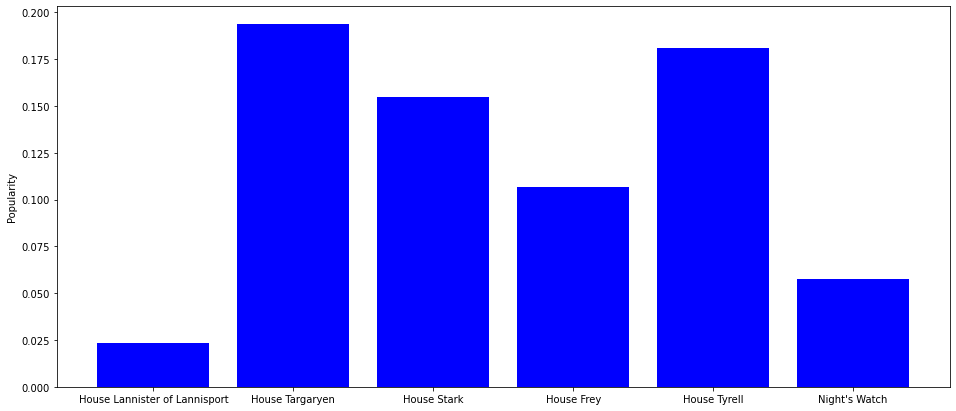

In [34]:
house_popularity_plot(['House Lannister of Lannisport', 'House Targaryen', 'House Stark', 'House Frey', 'House Tyrell', "Night's Watch"])

The above function house_popularity_plot() allows the user to enter a list of Game of Thrones houses available in the GoT dataset and display the mean popularity of all members of that house. The above plot shows a variety of houses and their relative mean popularity. A characters popularity is determined by the amount of traffic on their http://awoiaf.westeros.org wiki page. From this analysis, we can see that unsurprisingly the main houses of the show such as Targaryen, Stark and Tyrell are highly popular. More surprisingly is the low popularity of the Lannister house which has a large amount of screen time in the show. This may be due to their nature of being unlikable in the show.

## Question 3.3 Part A

In [35]:
# load in the famous people data and remove any duplicates.
person_df = pd.read_csv(r'C:\Users\kiera\OneDrive\Desktop\BSC Computer Science\Data Science for Economics\CA2\Q3 Data\person_2020_update.csv', low_memory=False)
person_df = person_df[~ person_df.duplicated()] 

In [36]:
# create a df where all persons are born after 1920 and have coordinate data.
df1 = person_df[(person_df['birthyear'] > 1920) & (person_df['bplace_lat'].notna()) & (person_df['bplace_lon'].notna()) & (person_df['dplace_lat'].notna()) & (person_df['dplace_lon'].notna())]
df1[['name', 'birthyear', 'bplace_lat', 'bplace_lon', 'dplace_lat', 'dplace_lon']]

,name,birthyear,bplace_lat,bplace_lon,dplace_lat,dplace_lon
32,Che Guevara,1928.0,-32.957500,-60.639444,-18.783333,-64.216667
67,Muhammad Ali,1942.0,38.256111,-85.751389,33.500000,-111.933333
116,Stephen Hawking,1942.0,51.751944,-1.257778,52.205278,0.119167
128,Marilyn Monroe,1926.0,34.050000,-118.250000,34.051940,-118.473060
147,Yuri Gagarin,1934.0,55.670833,35.053333,56.150000,38.866667
160,Steve Jobs,1955.0,37.777500,-122.416389,37.429167,-122.138056
165,Freddie Mercury,1946.0,-6.162400,39.191300,51.500000,-0.190000
171,Malcolm X,1925.0,41.250000,-96.000000,40.712740,-74.005974
175,Elvis Presley,1935.0,34.259722,-88.725833,35.117500,-89.971111
176,Bob Marley,1945.0,18.297800,-77.278100,25.775278,-80.208889


In [37]:
# set all latitude and longitude data in lists.
b_lat = df1['bplace_lat'].values
b_lon = df1['bplace_lon'].values
d_lat = df1['dplace_lat'].values
d_lon = df1['dplace_lon'].values

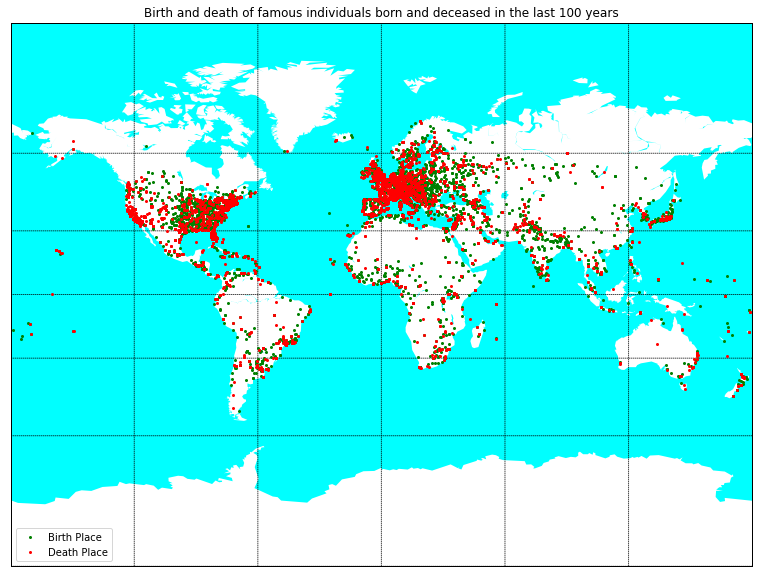

In [38]:
# create the basemap and style it.
plt.figure(figsize=(20,10))
m = Basemap(projection='mill',llcrnrlat=-90,urcrnrlat=90,\
            llcrnrlon=-180,urcrnrlon=180,resolution='c')
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,91.,30.))
m.drawmeridians(np.arange(-180.,181.,60.))
m.fillcontinents(color='white',lake_color='aqua')
m.drawmapboundary(fill_color='aqua')
plt.title("Birth and death of famous individuals born and deceased in the last 100 years")

# convert lat and lon to map projection coordinates.
b_lons, b_lats = m(b_lon, b_lat)
d_lons, d_lats = m(d_lon, d_lat)

# plot the coordinates on the basemap and show the basemap.
m.plot(b_lons,b_lats,'o', color = 'g', markersize=2, label = 'Birth Place')
m.plot(d_lons,d_lats,'o', color = 'r', markersize=2, label = 'Death Place')
plt.legend(loc = 'lower left')
plt.show()

## Question 3.3 Part B

In [39]:
# this function takes all ocupations in a list, calculates their mean hpi and plots it as a bar.
def occupation_hpi_plot(occupations): 
    plt.figure(figsize=(30, 12))

    for occupation in occupations:
        temp_df = person_df[(person_df['occupation'] == occupation)]
        mean_hpi = temp_df['hpi'].values.mean()
        plt.bar(occupation, mean_hpi, color = 'blue')
    plt.ylabel('Historical Popuilarity Index')
    plt.show()

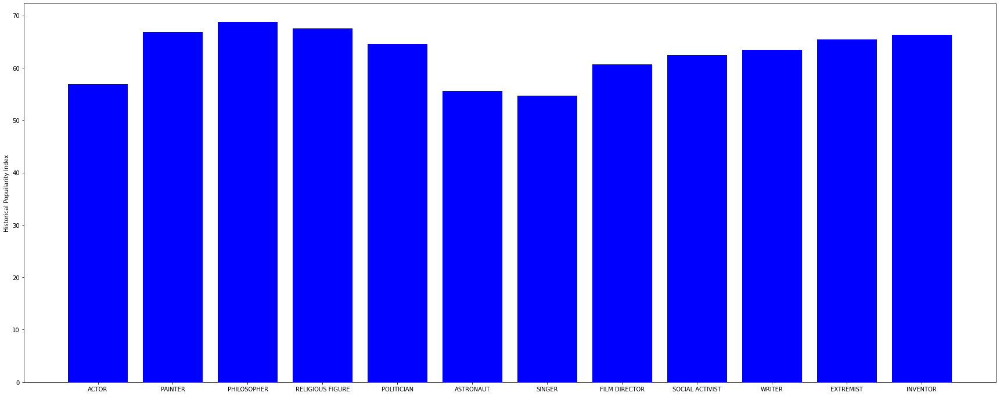

In [40]:
occupation_hpi_plot(['ACTOR', 'PAINTER', 'PHILOSOPHER', 'RELIGIOUS FIGURE', 'POLITICIAN', 'ASTRONAUT', 'SINGER', 'FILM DIRECTOR', 'SOCIAL ACTIVIST', 'WRITER', 'EXTREMIST', 'INVENTOR'])

The above function occupation_hpi_plot() allows the user to enter a list of occupations available in the famous person dataset and display that occupations mean historical popularity index. The above plot shows a variety of occupations and their relative mean HPI. This analysis produces some surprising results as we can see that extremists (such as Charles Manson and John Wilkes Booth) have a higher mean HPI than many well-respected occupations. It also shows us that popular modern mainstream occupations such as singers and actors have a much lower HPI than more outdated occupations such as inventors and philosophers.